In [1]:
import requests
import pymongo
import json
import hmac  # Library for HMAC-based authentication
import datetime  # Library for creating delays
from time import sleep  # Function for adding delays between requests
import hashlib  # Library for hashing
from pandas import read_csv


In [2]:
from pandas import read_csv

def remove_duplicates_from_csv(csv_file):
    df = read_csv(csv_file, header=0, sep="|")

    # Remove duplicates from the mnemonic column
    df.drop_duplicates(subset='mnemonic', keep='first', inplace=True)

    # Update the CSV file
    df.to_csv(csv_file, index=False, sep="|")

# Example usage
csv_file_path = r'C:\Users\KARAN\Desktop\assurant\Moody-Automated-ETL\Assurant_fullMnemonicList_20220510.csv'
remove_duplicates_from_csv(csv_file_path)


In [3]:
# Getting the mnemonic list ready to call the API
df = read_csv(r'C:\Users\KARAN\Desktop\assurant\Moody-Automated-ETL\Assurant_fullMnemonicList_20220510.csv', header=0, sep="|")
mn_list = df['mnemonic'].tolist()
mn_list[0] = mn_list[0][1:]
mn_list = mn_list[0:100]  # Reducing the list to 10 mnemonics for testing

In [4]:
def remove_duplicates(lst):
    duplicates = set()
    unique_elements = []

    for element in lst:
        if element not in duplicates:
            duplicates.add(element)
            unique_elements.append(element)

    return unique_elements


In [5]:
unique = remove_duplicates(mn_list)
print("Total dupes found = ",len(mn_list) - len(unique))
print("Duplicates printed and removed. Unique elements remaining:", len(unique))



Total dupes found =  0
Duplicates printed and removed. Unique elements remaining: 100


1619314

## We have to perform threading | parallelization in this part of the code.
### There are 3 functions to retrive the data, the api_call, the retrive batch and retrieve function.


In [6]:
"""#################################################################################"""
"""                            MoodysData Class                                     """
"""#################################################################################"""
"""
@desc <description of the class>
"""
class GetMoodysData(object):
    """
    @desc constructor initiate values for variables/attributes.
    @param accKey{string}: Access key for API authentication.
    @param encKey{string}: Encryption key for API authentication.
    @param BASKET_NAME{<type>}: <decription of BASKET_NAME>. Default is None.
    """
    def __init__(self, accKey, encKey):
        self.accKey = accKey  # Access key for API authentication
        self.encKey = encKey  # Encryption key for API authentication        

    """
    @desc Function for making API requests.
    @param apiCommand{string}: <decription of apiCommand>.
    @param accKey{string}: Access key for API authentication. [Is NOT being used]
    @param encKey{string}: Encryption key for API authentication. [Is NOT being used]
    @param call_type{string}: <decription of call_type>. Default is "GET".
    @param params{<type>}: <decription of params>. Default is None.
    @return response{request}: <description response>.
    """
    """If you are not gonna used accKey and encKey I would remove it"""
    def api_call(self, apiCommand, accKey, encKey, call_type="GET", params=None):
        url = "https://api.economy.com/data/v1/" + apiCommand
        timeStamp = datetime.datetime.strftime(datetime.datetime.utcnow(), "%Y-%m-%dT%H:%M:%SZ")
        payload = bytes(self.accKey + timeStamp, "utf-8")
        signature = hmac.new(bytes(self.encKey, "utf-8"), payload, digestmod=hashlib.sha256)
        head = {
            "AccessKeyId": self.accKey,
            "Signature": signature.hexdigest(),
            "TimeStamp": timeStamp,
        }
        sleep(1)
        if call_type == "POST":
            response = requests.post(url, headers=head, params=params)
        elif call_type == "DELETE":
            response = requests.delete(url, headers=head, params=params)
        else:
            response = requests.get(url, headers=head, params=params)
        return response

    """
    @desc retrieve multi-series data
    @param mnemonic_list{list}: <decription of mnemonic_list>.
    @param freq{<type>}: <decription of freq>. Default is None.
    @param trans{<type>}: <decription of trans>. Default is None.
    @param conv{<type>}: <decription of conv>. Default is None.
    @param startDate{<type>}: <decription of startDate>. Default is None.
    @param endDate{<type>}: <decription of endDate>. Default is None.
    @param vintage{<type>}: <decription of vintage>. Default is None.
    @param vintageVersion{<type>}: <decription of vintageVersion>. Default is None.
    @return results{list}: <description results>.
    """

    def retrieveMultiSeries(self, mnemonic_list, freq=None, trans=None, conv=None, startDate=None, endDate=None, vintage=None, vintageVersion=None):
        mnemonic_count = len(mnemonic_list)
        results = []

        batch_size = 25  # Adjust the batch size as per your requirements

        with concurrent.futures.ThreadPoolExecutor() as executor:
            # Create a list of futures for parallel API calls
            futures = []
            for i in range(0, mnemonic_count, batch_size):
                batch_mnemonics = mnemonic_list[i:i + batch_size]
                future = executor.submit(self.retrieveMultiSeriesBatch, batch_mnemonics, freq, trans, conv, startDate, endDate, vintage, vintageVersion)
                futures.append(future)

            # Wait for all futures to complete and collect the results
            for future in concurrent.futures.as_completed(futures):
                data = future.result()
                results.extend(data['data'])

        return results
    

    """
    @desc retrieve multi-series data for a batch of mnemonics
    @param mnemonic_list{list}: <decription of mnemonic_list>.
    @param freq{<type>}: <decription of freq>. Default is None.
    @param trans{<type>}: <decription of trans>. Default is None.
    @param conv{<type>}: <decription of conv>. Default is None.
    @param startDate{<type>}: <decription of startDate>. Default is None.
    @param endDate{<type>}: <decription of endDate>. Default is None.
    @param vintage{<type>}: <decription of vintage>. Default is None.
    @param vintageVersion{<type>}: <decription of vintageVersion>. Default is None.
    @return data{json}: <description data>.
    """
    def retrieveMultiSeriesBatch(self, mnemonic_list, freq=None, trans=None, conv=None, startDate=None, endDate=None, vintage=None, vintageVersion=None):
        mnemonic_param = ';'.join(mnemonic_list)
        params = {'m': mnemonic_param}

        if freq:
            params['freq'] = freq
        if trans:
            params['trans'] = trans
        if conv:
            params['conv'] = conv
        if startDate:
            params['startDate'] = startDate
        if endDate:
            params['endDate'] = endDate
        if vintage:
            params['vintage'] = vintage
        if vintageVersion:
            params['vintageVersion'] = vintageVersion

        response = self.api_call('multi-series', self.accKey, self.encKey, params=params)
        data = response.json()
        return data
    



## API credentials

In [7]:
ACC_KEY = "BF9706F2-610B-4907-8045-A1AF2E664A60"
ENC_KEY = "20B68D6B-CEB7-4885-BF55-293254D08E9F"

## API functioning

In [8]:
import concurrent.futures
import time

with concurrent.futures.ThreadPoolExecutor() as executor:
    num_threads = executor._max_workers

print(f"\nNumber of threads: {num_threads}")

constructor = GetMoodysData(accKey=ACC_KEY, encKey=ENC_KEY)

start_time = time.time()
data = constructor.retrieveMultiSeries(mn_list)
end_time = time.time()

elapsed_time = end_time - start_time

print(f"\nTotal time for {len(mn_list)} mnemonics : {elapsed_time} seconds")
print(f"Total time for 1619314 mnemonics : {((elapsed_time*1619314)/len(mn_list))/3600} hours")


#Checking errors
count, count_n = 0, 0
for i in data:
    if i.get('error') == 'Series Not Found':
        count_n += 1
    else:
        count += 1
print('\nTotal mnemonics retrieved:', count)
print('Total mnemonics not found:', count_n)


Number of threads: 12



Total time for 100 mnemonics : 4.135097980499268 seconds
Total time for 1619314 mnemonics : 18.600061253317197 hours

Total mnemonics retrieved: 100
Total mnemonics not found: 0


## MongoDB -> 

In [13]:
client = pymongo.MongoClient('mongodb://localhost:27017')
database = client['GUI']
collection = database['1kmn']

In [14]:
c=0
documents = []
for series in data:
    mnemonic = series['mnemonic']
    series_json = series
    document = {'_id': mnemonic, 'series_data': series_json}
    documents.append(document)

if documents:
    collection.insert_many(documents)

     

client.close()

## GUI

 * Serving Flask app '__main__'
 * Debug mode: on


 * Running on http://127.0.0.1:8000
Press CTRL+C to quit
 * Restarting with stat


SystemExit: 1

C:\Users\KARAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\IPython\core\interactiveshell.py:3561: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


## TKinter Implimentation

In [70]:

# Function to search a specific mnemonic
def search_mnemonic():
    mnemonic = search_entry.get()
    document = collection.find_one({'_id': mnemonic})
    if document:
        result_text.config(text="Data found:", bg="lightgreen")
        display_text.delete(1.0, tk.END)

        display_text.insert(tk.END, f"Description: {document['series_data']['description']}\n\n")

        display_text.insert(tk.END, f"Mnemonic: {document['_id']}\n\n")

        display_text.insert(tk.END, f"Frequency Conversion: {document['series_data']['appliedFreq']}\n")
        display_text.insert(tk.END, f"Transformation: {document['series_data']['appliedTransformation']}\n")
        display_text.insert(tk.END, f"Data Bank: {document['series_data']['databank']}\n")
        #display_text.insert(tk.END, f"Description: {document['series_data']['description']}\n")
        display_text.insert(tk.END, f"Frequency of Collection {document['series_data']['freqCode']}\n")
        display_text.insert(tk.END, f"Geographic Location: {document['series_data']['geoTitle']}\n")
        display_text.insert(tk.END, f"Mnemonic: {document['series_data']['mnemonic']}\n")
        display_text.insert(tk.END, f"Observed Attribute: {document['series_data']['observedAttribute']}\n")
        display_text.insert(tk.END, f"Source: {document['series_data']['source']}\n")
        display_text.insert(tk.END, f"Latest: {document['series_data']['lastHistory']}\n\n")
        display_text.insert(tk.END, f"Errors: {document['series_data']['error']}\n")
        
    else:
        result_text.config(text="Mnemonic not found.", bg="pink")
        display_text.delete(1.0, tk.END)


# Function to add data to the database
def add_data():
    mnemonic = add_mnemonic_entry.get()
    series_data = add_data_entry.get("1.0", tk.END).strip()
    document = {'_id': mnemonic, 'series_data': series_data}
    collection.insert_one(document)
    result_text.config(text="Data added successfully.", bg="lightgreen")
    display_text.delete(1.0, tk.END)

# Function to retrieve data
def retrieve_data():
    data = []
    for document in collection.find():
        data.append(document['_id'])
    result_text.config(text="Data retrieved successfully.", bg="lightgreen")
    display_text.delete(1.0, tk.END)
    display_text.insert(tk.END, "\n".join(data))



# Function to analyze and plot a time series
def analyze_time_series():
    mnemonic = analyze_entry.get()
    document = collection.find_one({'_id': mnemonic})
    if document:
        time_series = document['series_data']['data']
        
        # Extracting time and values from the time series
        dates = [data['date'] for data in time_series]
        values = [data['value'] for data in time_series]
        values = np.array(values)  # Convert values to a numpy array
        
        
        # Creating a new window for analysis
        analysis_window = tk.Toplevel(root)
        analysis_window.title(f"Time Series Analysis: {document['_id']}")

        # Basic data analysis
        mean_value = np.mean(values)
        std_value = np.std(values)
        min_value = np.min(values)
        max_value = np.max(values)
        
        # Line Plot
        line_plot_fig = plt.figure(figsize=(8, 6))
        plt.plot(dates, values)
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.title('Line Plot')
        line_plot_canvas = FigureCanvasTkAgg(line_plot_fig, master=analysis_window)
        line_plot_canvas.draw()
        line_plot_canvas.get_tk_widget().grid(row=0, column=0)

        
        # Histogram
        histogram_fig = plt.figure(figsize=(8, 6))
        plt.hist(values, bins='auto')
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.title('Histogram')
        histogram_canvas = FigureCanvasTkAgg(histogram_fig, master=analysis_window)
        histogram_canvas.draw()
        histogram_canvas.get_tk_widget().grid(row=0, column=1)
        
        
        # Box plot
             
        box_plot_fig = plt.figure(figsize=(8, 6))
        plt.boxplot(values)
        plt.xlabel('Values')
        plt.ylabel('Frequency')
        plt.title('Box Plot')
        box_plot_canvas = FigureCanvasTkAgg(box_plot_fig, master=analysis_window)
        box_plot_canvas.draw()
        box_plot_canvas.get_tk_widget().grid(row=1, column=0)

        
        # Autocorrelation Plot
        autocorr_plot_fig = plt.figure(figsize=(8, 6))
        pd.plotting.autocorrelation_plot(values, ax=plt.gca())
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Autocorrelation Plot')
        autocorr_plot_canvas = FigureCanvasTkAgg(autocorr_plot_fig, master=analysis_window)
        autocorr_plot_canvas.draw()
        autocorr_plot_canvas.get_tk_widget().grid(row=1, column=1)
        
        # Data description
        analysis_text = f"Data Description:\n\n" \
                        f"Mean Value: {mean_value:.2f}\n" \
                        f"Standard Deviation: {std_value:.2f}\n" \
                        f"Min Value: {min_value:.2f}\n" \
                        f"Max Value: {max_value:.2f}"
        analysis_label = tk.Label(analysis_window, text=analysis_text, padx=10, pady=10)
        analysis_label.grid(row=2, columnspan=2)
        
    else:
        result_text.config(text="Mnemonic not found.")

In [71]:
import tkinter as tk
from tkinter import messagebox
from PIL import Image, ImageTk

login_window = None  # Declare login_window as a global variable

# Function to create a new window
def create_new_window(window_title, image_path=None):
    new_window = tk.Toplevel(root)
    new_window.title(window_title)
    new_window.attributes("-fullscreen", True)
    return new_window

# Function to check login credentials
def check_login():
    username = username_entry.get()
    password = password_entry.get()
    if username == "admin" and password == "admin":
        landing_page()
    else:
        messagebox.showerror("Login Failed", "Wrong username or password")

# Function to create the landing page
def landing_page():
    landing_window = create_new_window("Landing Page")

    # Function to create new windows for each button
    def create_new_window_for_button(window_title):
        new_window = create_new_window(window_title)

        if window_title == "Check Mnemonic":
            create_input_textbox(new_window)
            create_back_button(new_window)
            search_label = tk.Label(root, text="Search Mnemonic:", bg="lightgray")
            search_entry = tk.Entry(root)
            search_button = tk.Button(root, text="Search", command=search_mnemonic)

            search_label.grid(row=0, column=0, padx=10, pady=10)
            search_entry.grid(row=0, column=1, padx=10, pady=10)
            search_button.grid(row=0, column=2, padx=10, pady=10)

        else:
            root.quit()

    # Function to create an input textbox in the window
    def create_input_textbox(window):
        textbox_label = tk.Label(window, text="Input:", font=("Helvetica", 20))
        textbox_label.pack(pady=10)
        input_textbox = tk.Entry(window, font=("Helvetica", 20))
        input_textbox.pack(pady=10)

    # Function to go back to the landing page
    def go_back_to_landing():
        landing_window.destroy()
        landing_page()

    # Function to create a "Back" button in the window
    def create_back_button(window):
        back_button = tk.Button(
            window,
            text="Back",
            font=("Helvetica", 20),
            width=10,
            height=1,
            command=go_back_to_landing
        )
        back_button.pack(pady=10)

    # Buttons in the landing page
    buttons = [
        ("Check if Mnemonic Exists", create_new_window_for_button, "Check Mnemonic"),
        ("Retrieve Particular Mnemonic's Data", create_new_window_for_button, "Retrieve Data"),
        ("Run DBMS Queries", create_new_window_for_button, "DBMS Queries"),
        ("Analyze Data", create_new_window_for_button, "Analyze Data"),
        ("Enter Records Manually", create_new_window_for_button, "Enter Records"),
        ("Exit", create_new_window_for_button, "Exit")
    ]

    # Create buttons in the landing page
    for button_text, command, window_title in buttons:
        button = tk.Button(
            landing_window,
            text=button_text,
            font=("Helvetica", 20),
            width=30,
            height=2,
            command=lambda cmd=command, title=window_title: cmd(title)
        )
        button.pack(pady=20)



In [72]:
# Create the main login window
root = tk.Tk()
root.title("Login Page")
root.attributes("-fullscreen", True)

# Login page components
login_frame = tk.Frame(root)
login_frame.pack(pady=200)

username_label = tk.Label(login_frame, text="Username:", font=("Helvetica", 20))
username_label.grid(row=0, column=0, padx=10, pady=10)
username_entry = tk.Entry(login_frame, font=("Helvetica", 20))
username_entry.grid(row=0, column=1, padx=10, pady=10)

password_label = tk.Label(login_frame, text="Password:", font=("Helvetica", 20))
password_label.grid(row=1, column=0, padx=10, pady=10)
password_entry = tk.Entry(login_frame, show="*", font=("Helvetica", 20))
password_entry.grid(row=1, column=1, padx=10, pady=10)

login_button = tk.Button(login_frame, text="Login", font=("Helvetica", 20), command=check_login)
login_button.grid(row=2, columnspan=2, padx=10, pady=10)

# Run the application
root.mainloop()


Exception in Tkinter callback
Traceback (most recent call last):
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.10_3.10.3056.0_x64__qbz5n2kfra8p0\lib\tkinter\__init__.py", line 1921, in __call__
    return self.func(*args)
  File "C:\Windows\Temp\ipykernel_27564\2312369273.py", line 87, in <lambda>
    command=lambda cmd=command, title=window_title: cmd(title)
  File "C:\Windows\Temp\ipykernel_27564\2312369273.py", line 38, in create_new_window_for_button
    search_label.grid(row=0, column=0, padx=10, pady=10)
  File "C:\Program Files\WindowsApps\PythonSoftwareFoundation.Python.3.10_3.10.3056.0_x64__qbz5n2kfra8p0\lib\tkinter\__init__.py", line 2522, in grid_configure
    self.tk.call(
_tkinter.TclError: cannot use geometry manager grid inside . which already has slaves managed by pack


: 

In [ ]:
# GUI components
search_label = tk.Label(root, text="Search Mnemonic:", bg="lightgray")
search_entry = tk.Entry(root)
search_button = tk.Button(root, text="Search", command=search_mnemonic)

add_label = tk.Label(root, text="Add Data:", bg="lightgray")
add_mnemonic_label = tk.Label(root, text="Mnemonic:")
add_mnemonic_entry = tk.Entry(root)
add_data_label = tk.Label(root, text="Series Data:")
add_data_entry = tk.Text(root, height=5, width=30)
add_button = tk.Button(root, text="Add", command=add_data)

retrieve_button = tk.Button(root, text="Retrieve Data", command=retrieve_data)

analyze_label = tk.Label(root, text="Analyze Time Series:", bg="lightgray")
analyze_entry = tk.Entry(root)
analyze_button = tk.Button(root, text="Analyze", command=analyze_time_series)

result_text = tk.Label(root, text="", bg="lightgray", fg="black", font=("Arial", 12, "bold"))

display_text = tk.Text(root, height=20, width=60, font=("Arial", 10))

# GUI layout
search_label.grid(row=0, column=0, padx=10, pady=10)
search_entry.grid(row=0, column=1, padx=10, pady=10)
search_button.grid(row=0, column=2, padx=10, pady=10)

add_label.grid(row=1, column=0, padx=10, pady=10)
add_mnemonic_label.grid(row=2, column=0, padx=10, pady=10)
add_mnemonic_entry.grid(row=2, column=1, padx=10, pady=10)
add_data_label.grid(row=3, column=0, padx=10, pady=10)
add_data_entry.grid(row=3, column=1, padx=10, pady=10)
add_button.grid(row=4, column=1, padx=10, pady=10)

retrieve_button.grid(row=5, column=1, padx=10, pady=10)

analyze_label.grid(row=6, column=0, padx=10, pady=10)
analyze_entry.grid(row=7, column=1, padx=10, pady=10)
analyze_button.grid(row=7, column=2, padx=10, pady=10)

result_text.grid(row=8, column=0, columnspan=3, padx=10, pady=10)
display_text.grid(row=9, column=0, columnspan=3, padx=10, pady=10)


In [ ]:
 I wanted to provide an update on the current status of our projects and discuss some upcoming tasks and considerations. Please find below a breakdown of the past, present, and future tasks:

Past Tasks:

Moody's Project:
Created a new API function to retrieve only the new data points (quarterly and monthly).
Deployment of the existing code on the server is in progress and expected to be completed within the next 10 days.
Containerization of the solution is due and will be completed shortly.
Discussed scheduling the API using Airflow or Mage for automating the process.
Working On:

Customer Journey Mapping (CJM) Project:
Currently 7-10 days behind the deliverable schedule.
Completed the initial analysis of key business questions.
Next meeting scheduled to finalize the analysis.
Hania, our data services intern, will be leaving soon, which will create a void in the team.
Future Tasks:

Moody's Project:

Complete containerization and deployment of the solution.
Implement scheduled API calls for automation.
Tentative completion date: 31st July.
CJM Project:

Catch up on the deliverable schedule.
Complete the remaining milestones (6/10) by 15th July.
Plan for filling the gap created by Hania's departure.
To address Shaunak's suggestion, I will organize these details in a more structured manner:

Finished Tasks:

Moody's Project: Created a new API function and ongoing deployment.
CJM Project: Initial analysis of key business questions.
Working On:

CJM Project: Catching up on the deliverable schedule.
Future Tasks:

Moody's Project: Containerization, scheduled API calls, and completion by 31st July.
CJM Project: Completion of remaining milestones (6/10) by 15th July and filling the intern gap.
I kindly request your assistance in discussing these updates outside of our weekly project updates call. It would be beneficial to have a dedicated discussion with Yingying, and we can also report the details to Stacey or any other relevant stakeholders.

Please let me know if there are any further details or updates you would like me to include in the email. I will promptly send it out once I receive your confirmation.

Thank you for your attention to this matter, and I look forward to your feedback.

Best regards,

Jaskaran Singh Walia (Karan Walia)
Data Science Team

In [58]:
import tkinter as tk
from pymongo import MongoClient
import matplotlib.pyplot as plt
import tkinter as tk
from pymongo import MongoClient
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from scipy import signal
import pandas as pd


In [59]:
# MongoDB connection
client = MongoClient('mongodb://localhost:27017')
database = client['GUI']
collection = database['1kmn']

In [ ]:

# Create the main login window
root = tk.Tk()
root.title("Login Page")
root.attributes("-fullscreen", True)

# Login page components
login_frame = tk.Frame(root)
login_frame.pack(pady=200)

username_label = tk.Label(login_frame, text="Username:", font=("Helvetica", 20))
username_label.grid(row=0, column=0, padx=10, pady=10)
username_entry = tk.Entry(login_frame, font=("Helvetica", 20))
username_entry.grid(row=0, column=1, padx=10, pady=10)

password_label = tk.Label(login_frame, text="Password:", font=("Helvetica", 20))
password_label.grid(row=1, column=0, padx=10, pady=10)
password_entry = tk.Entry(login_frame, show="*", font=("Helvetica", 20))
password_entry.grid(row=1, column=1, padx=10, pady=10)

login_button = tk.Button(login_frame, text="Login", font=("Helvetica", 20), command=check_login)
login_button.grid(row=2, columnspan=2, padx=10, pady=10)

# Run the application
root.mainloop()

In [ ]:
# GUI components
search_label = tk.Label(root, text="Search Mnemonic:", bg="lightgray")
search_entry = tk.Entry(root)
search_button = tk.Button(root, text="Search", command=search_mnemonic)

add_label = tk.Label(root, text="Add Data:", bg="lightgray")
add_mnemonic_label = tk.Label(root, text="Mnemonic:")
add_mnemonic_entry = tk.Entry(root)
add_data_label = tk.Label(root, text="Series Data:")
add_data_entry = tk.Text(root, height=5, width=30)
add_button = tk.Button(root, text="Add", command=add_data)

retrieve_button = tk.Button(root, text="Retrieve Data", command=retrieve_data)

analyze_label = tk.Label(root, text="Analyze Time Series:", bg="lightgray")
analyze_entry = tk.Entry(root)
analyze_button = tk.Button(root, text="Analyze", command=analyze_time_series)

result_text = tk.Label(root, text="", bg="lightgray", fg="black", font=("Arial", 12, "bold"))

display_text = tk.Text(root, height=20, width=60, font=("Arial", 10))

# GUI layout
search_label.grid(row=0, column=0, padx=10, pady=10)
search_entry.grid(row=0, column=1, padx=10, pady=10)
search_button.grid(row=0, column=2, padx=10, pady=10)

add_label.grid(row=1, column=0, padx=10, pady=10)
add_mnemonic_label.grid(row=2, column=0, padx=10, pady=10)
add_mnemonic_entry.grid(row=2, column=1, padx=10, pady=10)
add_data_label.grid(row=3, column=0, padx=10, pady=10)
add_data_entry.grid(row=3, column=1, padx=10, pady=10)
add_button.grid(row=4, column=1, padx=10, pady=10)

retrieve_button.grid(row=5, column=1, padx=10, pady=10)

analyze_label.grid(row=6, column=0, padx=10, pady=10)
analyze_entry.grid(row=7, column=1, padx=10, pady=10)
analyze_button.grid(row=7, column=2, padx=10, pady=10)

result_text.grid(row=8, column=0, columnspan=3, padx=10, pady=10)
display_text.grid(row=9, column=0, columnspan=3, padx=10, pady=10)


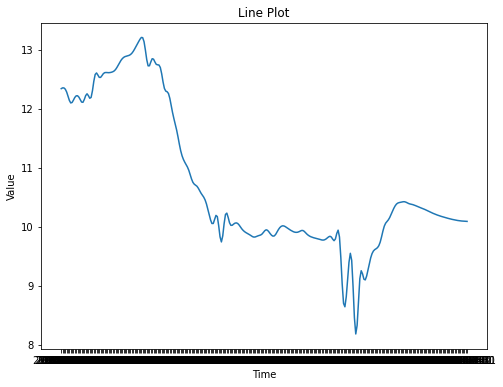

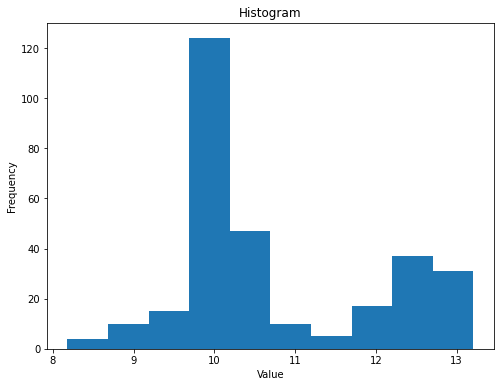

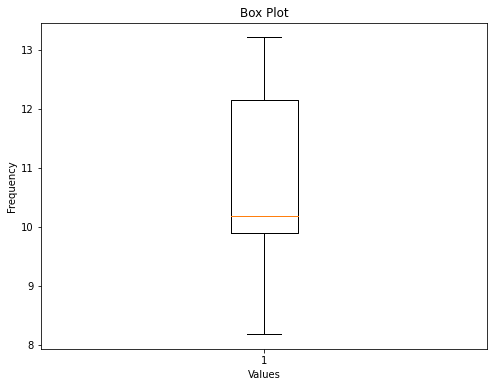

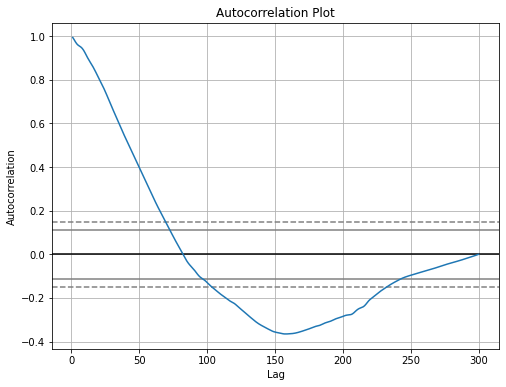

In [3]:
import tkinter as tk
from pymongo import MongoClient
import matplotlib.pyplot as plt
import tkinter as tk
from pymongo import MongoClient
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from scipy import signal
import pandas as pd



# Tkinter GUI
root = tk.Tk()
root.title("Time Series Data Management")
root.configure(bg="lightgray")

# Function to search a specific mnemonic
def search_mnemonic():
    mnemonic = search_entry.get()
    document = collection.find_one({'_id': mnemonic})
    if document:
        result_text.config(text="Data found:", bg="lightgreen")
        display_text.delete(1.0, tk.END)

        display_text.insert(tk.END, f"Description: {document['series_data']['description']}\n\n")

        display_text.insert(tk.END, f"Mnemonic: {document['_id']}\n\n")

        display_text.insert(tk.END, f"Frequency Conversion: {document['series_data']['appliedFreq']}\n")
        display_text.insert(tk.END, f"Transformation: {document['series_data']['appliedTransformation']}\n")
        display_text.insert(tk.END, f"Data Bank: {document['series_data']['databank']}\n")
        #display_text.insert(tk.END, f"Description: {document['series_data']['description']}\n")
        display_text.insert(tk.END, f"Frequency of Collection {document['series_data']['freqCode']}\n")
        display_text.insert(tk.END, f"Geographic Location: {document['series_data']['geoTitle']}\n")
        display_text.insert(tk.END, f"Mnemonic: {document['series_data']['mnemonic']}\n")
        display_text.insert(tk.END, f"Observed Attribute: {document['series_data']['observedAttribute']}\n")
        display_text.insert(tk.END, f"Source: {document['series_data']['source']}\n")
        display_text.insert(tk.END, f"Latest: {document['series_data']['lastHistory']}\n\n")
        display_text.insert(tk.END, f"Errors: {document['series_data']['error']}\n")
        
    else:
        result_text.config(text="Mnemonic not found.", bg="pink")
        display_text.delete(1.0, tk.END)


# Function to add data to the database
def add_data():
    mnemonic = add_mnemonic_entry.get()
    series_data = add_data_entry.get("1.0", tk.END).strip()
    document = {'_id': mnemonic, 'series_data': series_data}
    collection.insert_one(document)
    result_text.config(text="Data added successfully.", bg="lightgreen")
    display_text.delete(1.0, tk.END)

# Function to retrieve data
def retrieve_data():
    data = []
    for document in collection.find():
        data.append(document['_id'])
    result_text.config(text="Data retrieved successfully.", bg="lightgreen")
    display_text.delete(1.0, tk.END)
    display_text.insert(tk.END, "\n".join(data))



# Function to analyze and plot a time series
def analyze_time_series():
    mnemonic = analyze_entry.get()
    document = collection.find_one({'_id': mnemonic})
    if document:
        time_series = document['series_data']['data']
        
        # Extracting time and values from the time series
        dates = [data['date'] for data in time_series]
        values = [data['value'] for data in time_series]
        values = np.array(values)  # Convert values to a numpy array
        
        
        # Creating a new window for analysis
        analysis_window = tk.Toplevel(root)
        analysis_window.title(f"Time Series Analysis: {document['_id']}")

        # Basic data analysis
        mean_value = np.mean(values)
        std_value = np.std(values)
        min_value = np.min(values)
        max_value = np.max(values)
        
        # Line Plot
        line_plot_fig = plt.figure(figsize=(8, 6))
        plt.plot(dates, values)
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.title('Line Plot')
        line_plot_canvas = FigureCanvasTkAgg(line_plot_fig, master=analysis_window)
        line_plot_canvas.draw()
        line_plot_canvas.get_tk_widget().grid(row=0, column=0)

        
        # Histogram
        histogram_fig = plt.figure(figsize=(8, 6))
        plt.hist(values, bins='auto')
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.title('Histogram')
        histogram_canvas = FigureCanvasTkAgg(histogram_fig, master=analysis_window)
        histogram_canvas.draw()
        histogram_canvas.get_tk_widget().grid(row=0, column=1)
        
        
        # Box plot
             
        box_plot_fig = plt.figure(figsize=(8, 6))
        plt.boxplot(values)
        plt.xlabel('Values')
        plt.ylabel('Frequency')
        plt.title('Box Plot')
        box_plot_canvas = FigureCanvasTkAgg(box_plot_fig, master=analysis_window)
        box_plot_canvas.draw()
        box_plot_canvas.get_tk_widget().grid(row=1, column=0)

        
        # Autocorrelation Plot
        autocorr_plot_fig = plt.figure(figsize=(8, 6))
        pd.plotting.autocorrelation_plot(values, ax=plt.gca())
        plt.xlabel('Lag')
        plt.ylabel('Autocorrelation')
        plt.title('Autocorrelation Plot')
        autocorr_plot_canvas = FigureCanvasTkAgg(autocorr_plot_fig, master=analysis_window)
        autocorr_plot_canvas.draw()
        autocorr_plot_canvas.get_tk_widget().grid(row=1, column=1)
        
        # Data description
        analysis_text = f"Data Description:\n\n" \
                        f"Mean Value: {mean_value:.2f}\n" \
                        f"Standard Deviation: {std_value:.2f}\n" \
                        f"Min Value: {min_value:.2f}\n" \
                        f"Max Value: {max_value:.2f}"
        analysis_label = tk.Label(analysis_window, text=analysis_text, padx=10, pady=10)
        analysis_label.grid(row=2, columnspan=2)
        
    else:
        result_text.config(text="Mnemonic not found.")







# GUI components
search_label = tk.Label(root, text="Search Mnemonic:", bg="lightgray")
search_entry = tk.Entry(root)
search_button = tk.Button(root, text="Search", command=search_mnemonic)

add_label = tk.Label(root, text="Add Data:", bg="lightgray")
add_mnemonic_label = tk.Label(root, text="Mnemonic:")
add_mnemonic_entry = tk.Entry(root)
add_data_label = tk.Label(root, text="Series Data:")
add_data_entry = tk.Text(root, height=5, width=30)
add_button = tk.Button(root, text="Add", command=add_data)

retrieve_button = tk.Button(root, text="Retrieve Data", command=retrieve_data)

analyze_label = tk.Label(root, text="Analyze Time Series:", bg="lightgray")
analyze_entry = tk.Entry(root)
analyze_button = tk.Button(root, text="Analyze", command=analyze_time_series)

result_text = tk.Label(root, text="", bg="lightgray", fg="black", font=("Arial", 12, "bold"))

display_text = tk.Text(root, height=20, width=60, font=("Arial", 10))

# GUI layout
search_label.grid(row=0, column=0, padx=10, pady=10)
search_entry.grid(row=0, column=1, padx=10, pady=10)
search_button.grid(row=0, column=2, padx=10, pady=10)

add_label.grid(row=1, column=0, padx=10, pady=10)
add_mnemonic_label.grid(row=2, column=0, padx=10, pady=10)
add_mnemonic_entry.grid(row=2, column=1, padx=10, pady=10)
add_data_label.grid(row=3, column=0, padx=10, pady=10)
add_data_entry.grid(row=3, column=1, padx=10, pady=10)
add_button.grid(row=4, column=1, padx=10, pady=10)

retrieve_button.grid(row=5, column=1, padx=10, pady=10)

analyze_label.grid(row=6, column=0, padx=10, pady=10)
analyze_entry.grid(row=7, column=1, padx=10, pady=10)
analyze_button.grid(row=7, column=2, padx=10, pady=10)

result_text.grid(row=8, column=0, columnspan=3, padx=10, pady=10)
display_text.grid(row=9, column=0, columnspan=3, padx=10, pady=10)

root.mainloop()


## Cassandra ->

In [26]:
from cassandra.cluster import Cluster
from cassandra.auth import PlainTextAuthProvider

# Cassandra credentials
USERNAME = "your_username"
PASSWORD = "your_password"
CONTACT_POINTS = ["127.0.0.1"]  # Update with your Cassandra contact points
KEYSPACE = "moodys"  # Update with your desired keyspace name

# Establish a connection to Cassandra cluster
auth_provider = PlainTextAuthProvider(username=USERNAME, password=PASSWORD)
cluster = Cluster(contact_points=CONTACT_POINTS, auth_provider=auth_provider)
session = cluster.connect(KEYSPACE)

# Create a table in Cassandra (if it doesn't exist)
session.execute("""
    CREATE TABLE IF NOT EXISTS mn_data (
        mnemonic TEXT PRIMARY KEY,
        series_data TEXT
    )
""")

# Prepare the data for insertion into Cassandra
prepared_insert = session.prepare("""
    INSERT INTO mn_data (mnemonic, series_data)
    VALUES (?, ?)
""")

# Store the data into Cassandra
for series in data:
    mnemonic = series['mnemonic']
    series_json = str(series)  # Convert the series data to a string
    session.execute(prepared_insert, (mnemonic, series_json))

# Close the Cassandra connection
session.shutdown()
cluster.shutdown()


In [27]:
from cassandra.cluster import Cluster

# Cassandra credentials and connection details
USERNAME = "your_username"
PASSWORD = "your_password"
CONTACT_POINTS = ["127.0.0.1"]  # Update with your Cassandra contact points
KEYSPACE = "moodys"  # Update with your keyspace name

# Establish a connection to Cassandra cluster
cluster = Cluster(contact_points=CONTACT_POINTS, auth_provider=PlainTextAuthProvider(username=USERNAME, password=PASSWORD))
session = cluster.connect(KEYSPACE)

# Retrieve and print the data from the mn_data table
rows = session.execute("SELECT * FROM mn_data")
for row in rows:
    print("Mnemonic:", row.mnemonic)
    print("Series Data:", row.series_data)
    print()

# Close the Cassandra connection
session.shutdown()
cluster.shutdown()


Mnemonic: FCF5RF$M_2015Q2_CF.IUSA
Series Data: {'appliedFreq': 128, 'appliedTransformation': 0, 'databank': 'FCF5RFM_CF_US.db', 'description': 'Consensus (March 2023) First Mortgage Total: Total Outstanding Balance - Vintage: 2015Q2, (Mil. $, NSA)', 'error': None, 'freqCode': 'MONTH', 'geoTitle': 'United States', 'mnemonic': 'FCF5RF$M_2015Q2_CF.IUSA', 'observedAttribute': 'AVERAGED', 'source': "Moody's Analytics; Equifax", 'lastHistory': '2023-03-31', 'data': [{'date': '2015-04-30', 'value': 2450.081598}, {'date': '2015-05-31', 'value': 61015.293196}, {'date': '2015-06-30', 'value': 145778.817498}, {'date': '2015-07-31', 'value': 245209.862916}, {'date': '2015-08-31', 'value': 342932.83208}, {'date': '2015-09-30', 'value': 404082.884567}, {'date': '2015-10-31', 'value': 453735.794604}, {'date': '2015-11-30', 'value': 466339.214922}, {'date': '2015-12-31', 'value': 465955.679258}, {'date': '2016-01-31', 'value': 461985.106807}, {'date': '2016-02-29', 'value': 459748.800176}, {'date': '2

## SQL

In [ ]:
import sqlite3
import json

# Connect to the database
conn = sqlite3.connect('data.db')
cursor = conn.cursor()

# Create the schema
cursor.execute('''
    CREATE TABLE IF NOT EXISTS mn_data (
        id INTEGER PRIMARY KEY AUTOINCREMENT,
        mnemonic TEXT,
        appliedFreq INTEGER,
        appliedTransformation INTEGER,
        databank TEXT,
        description TEXT,
        error TEXT,
        freqCode TEXT,
        geoTitle TEXT,
        observedAttribute TEXT,
        source TEXT,
        lastHistory TEXT,
        data TEXT
    )
''')



# Insert the data into the database
cursor.execute('''
    INSERT INTO mn_data (mnemonic, appliedFreq, appliedTransformation, databank, description, error, freqCode, geoTitle, observedAttribute, source, lastHistory, data)
    VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)
''', (
    data['mnemonic'],
    data['appliedFreq'],
    data['appliedTransformation'],
    data['databank'],
    data['description'],
    data['error'],
    data['freqCode'],
    data['geoTitle'],
    data['observedAttribute'],
    data['source'],
    data['lastHistory'],
    json_data
))

# Commit the changes and close the connection
conn.commit()
conn.close()